# LOADING DATA

In [1]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import matplotlib.colors as mcolors 
import random
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv(r'C:\Users\halis\Desktop\capstone project\AB_NYC_2019.csv')

In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


# DATA CLEANING

In [4]:
# get info about data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [5]:
#find which columns has NAN values 
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [6]:
#check the reletationship between nan value rows
df[pd.isnull(df[('last_review')])]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
19,7750,Huge 2 BR Upper East Cental Park,17985,Sing,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,NaN,NaN,2,249
26,8700,Magnifique Suite au N de Manhattan - vue Cloitres,26394,Claude & Sophie,Manhattan,Inwood,40.86754,-73.92639,Private room,80,4,0,NaN,NaN,1,0
36,11452,Clean and Quiet in Brooklyn,7355,Vt,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,Private room,35,60,0,NaN,NaN,1,365
38,11943,Country space in the city,45445,Harriet,Brooklyn,Flatbush,40.63702,-73.96327,Private room,150,1,0,NaN,NaN,1,365
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


In [7]:
# The same rows in last_review and review_per_month columns are nan values. Also for these rows, number_of_reviews is 0.
# So, we can replace review_per_month with 0
df.fillna({'reviews_per_month':0}, inplace=True)

In [8]:
# When we check the columns, 'name' and 'host_name' are irrelevant with our fruther work. We can drop them directly.
# If there is no review for the data, then there is no last_review data. last_review is not relevant with our data.
# We will remove 'name','host_name' and 'last_review'
df.drop(['name','host_name','last_review'], axis=1, inplace=True)

In [9]:
# Let's check our data info for datatypes again
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 13 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   host_id                         48895 non-null  int64  
 2   neighbourhood_group             48895 non-null  object 
 3   neighbourhood                   48895 non-null  object 
 4   latitude                        48895 non-null  float64
 5   longitude                       48895 non-null  float64
 6   room_type                       48895 non-null  object 
 7   price                           48895 non-null  int64  
 8   minimum_nights                  48895 non-null  int64  
 9   number_of_reviews               48895 non-null  int64  
 10  reviews_per_month               48895 non-null  float64
 11  calculated_host_listings_count  48895 non-null  int64  
 12  availability_365                

In [10]:
# All data types are good and there is no more Nan values
df.head()

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2595,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,3647,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365
3,3831,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,5022,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


# EXPLORING AND VISIUALIZING DATA

# Host_id

In [11]:
host_count=df.host_id.value_counts().head(10)
host_count

219517861    327
107434423    232
30283594     121
137358866    103
12243051      96
16098958      96
61391963      91
22541573      87
200380610     65
7503643       52
Name: host_id, dtype: int64

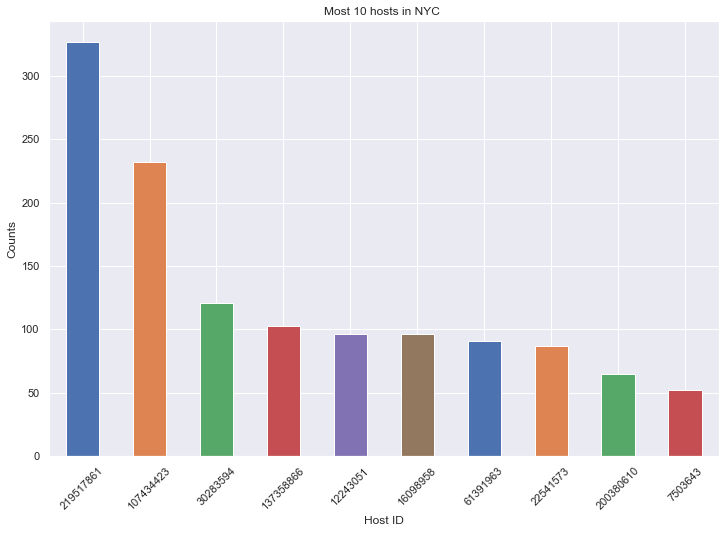

In [12]:
sns.set(rc={'figure.figsize':(12,8)})
visual1=host_count.plot(kind='bar', color=['C0','C1','C2','C3','C4','C5'])
visual1.set_ylabel('Counts')
visual1.set_xlabel('Host ID')
visual1.set_title('Most 10 hosts in NYC ')
visual1.set_xticklabels(visual1.get_xticklabels(), rotation=45)
plt.show()

# Neighbourhood group

In [13]:
n_group_count=df.neighbourhood_group.value_counts()
n_group_count

Manhattan        21661
Brooklyn         20104
Queens            5666
Bronx             1091
Staten Island      373
Name: neighbourhood_group, dtype: int64

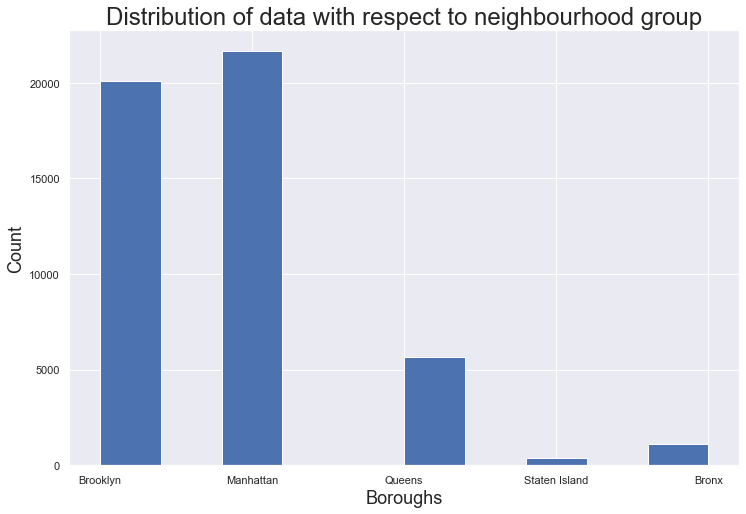

In [14]:
sns.set(rc={'figure.figsize':(12,8),"axes.titlesize":24,"axes.labelsize":18})
plt.hist(x=df['neighbourhood_group'])
plt.xlabel('Boroughs')
plt.ylabel('Count')
plt.title('Distribution of data with respect to neighbourhood group')
plt.show()

# Price distribution

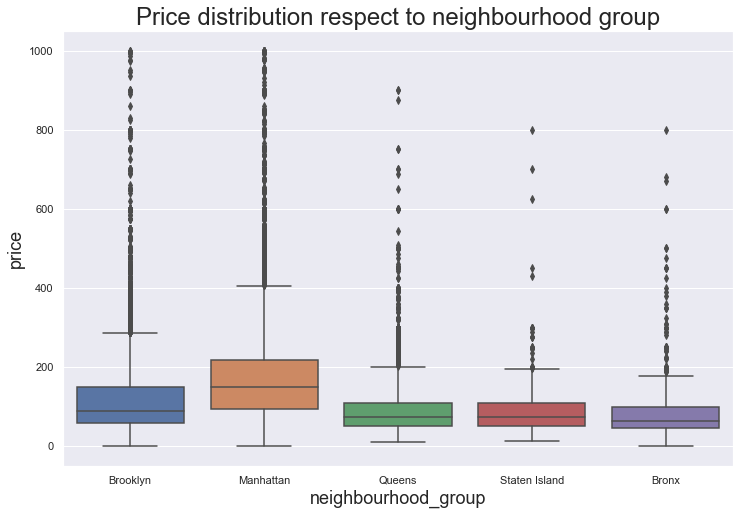

In [15]:
sns.set(rc={'figure.figsize':(12,8),"axes.titlesize":24,"axes.labelsize":18})
df1=df[df['price']<1000]
sns.boxplot(data=df1,x='neighbourhood_group',y='price').set_title('Price distribution respect to neighbourhood group')
plt.show()

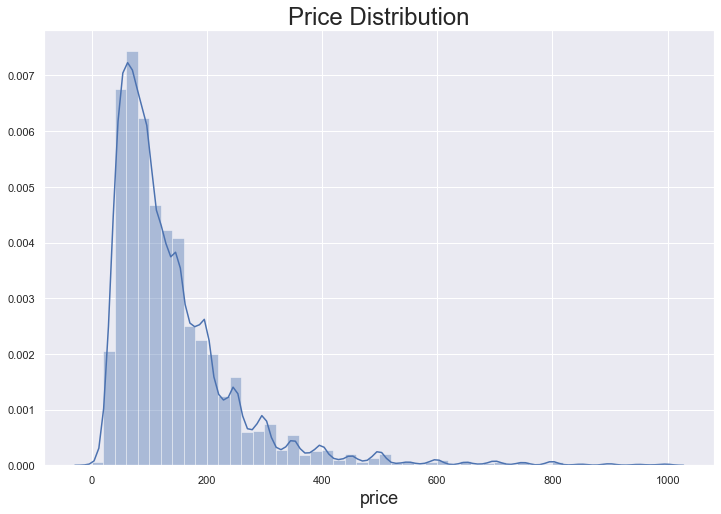

In [16]:
sns.distplot(df1['price'])
plt.title('Price Distribution')
plt.show()

# Neighbourhood

In [17]:
n_count=df.neighbourhood.value_counts()
n_count.head(10)

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Hell's Kitchen        1958
East Village          1853
Upper East Side       1798
Crown Heights         1564
Midtown               1545
Name: neighbourhood, dtype: int64

In [18]:
region=df.groupby(['neighbourhood_group','neighbourhood']).count()[['id']]
region=region['id'].groupby(level=0, group_keys=False)
region.nlargest()

neighbourhood_group  neighbourhood     
Bronx                Kingsbridge             70
                     Fordham                 63
                     Longwood                62
                     Mott Haven              60
                     Concourse               50
Brooklyn             Williamsburg          3920
                     Bedford-Stuyvesant    3714
                     Bushwick              2465
                     Crown Heights         1564
                     Greenpoint            1115
Manhattan            Harlem                2658
                     Upper West Side       1971
                     Hell's Kitchen        1958
                     East Village          1853
                     Upper East Side       1798
Queens               Astoria                900
                     Long Island City       537
                     Flushing               426
                     Ridgewood              423
                     Sunnyside              363


# Relationship between Room Types and Neighbourhood

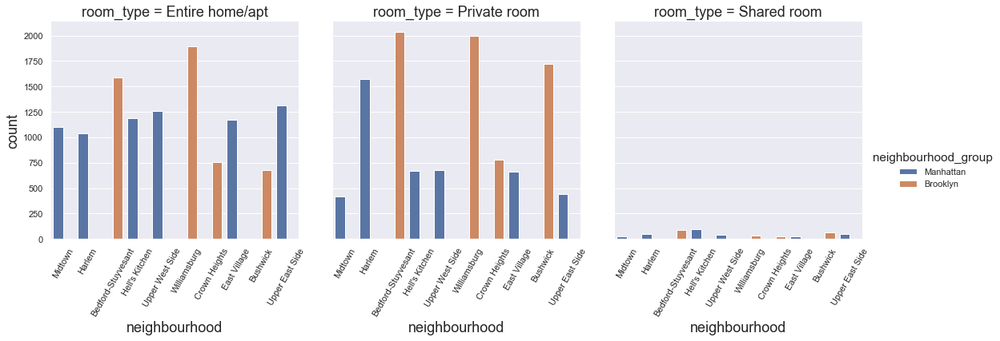

In [19]:
neibrhood_grb=df.loc[df['neighbourhood'].isin(['Williamsburg','Bedford-Stuyvesant','Harlem','Bushwick',
                    'Upper West Side','Hell\'s Kitchen','East Village','Upper East Side','Crown Heights','Midtown'])]
viasul2=sns.catplot(x='neighbourhood', hue='neighbourhood_group', col='room_type', data=neibrhood_grb, kind='count')
viasul2.set_xticklabels(rotation=60)

# Price Distribution for Room Types

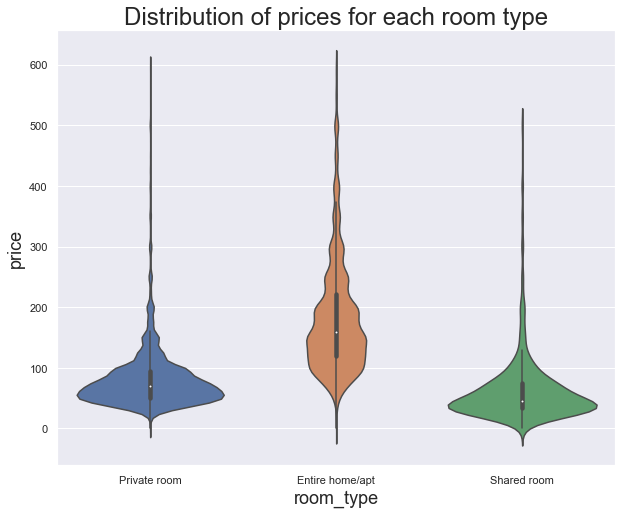

In [20]:
sns.set(rc={'figure.figsize':(10,8),"axes.titlesize":24,"axes.labelsize":18})
df2=df[df.price<600]
visual3=sns.violinplot(data=df2, x='room_type', y='price')
visual3.set_title('Distribution of prices for each room type')
plt.show()

# Room Details

In [21]:
df.room_type.value_counts()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

In [22]:
room_labels=list(df["room_type"].unique())
room_labels

['Private room', 'Entire home/apt', 'Shared room']

In [23]:
room_vals=list(df.room_type.value_counts())
room_vals

[25409, 22326, 1160]

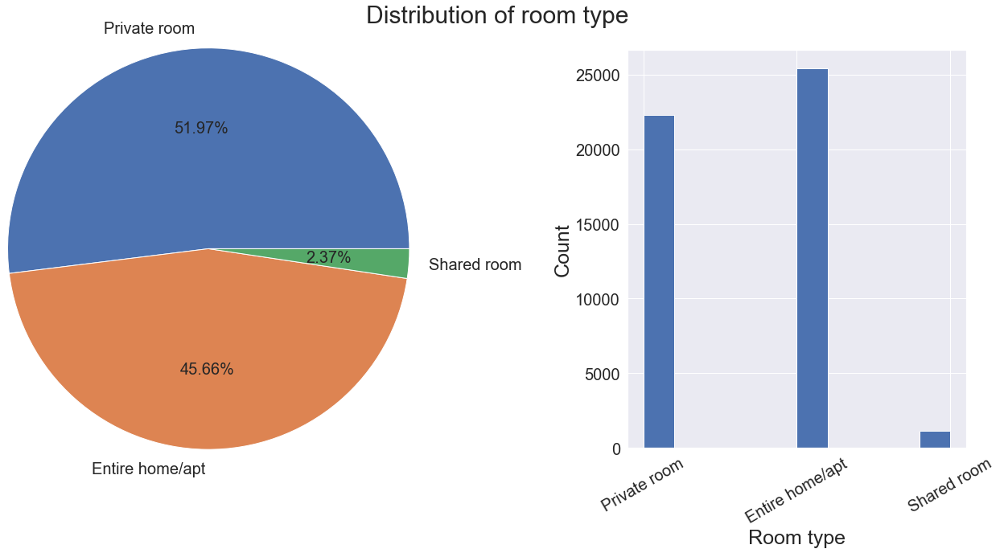

In [24]:
fig = plt.figure()
fig.set_figheight(10)
fig.set_figwidth(18)
plt.subplot(1, 2, 1)
plt.axis('equal')
plt.pie(room_vals,labels=room_labels,radius=1.5,autopct='%0.2f%%',textprops={'fontsize': 20})
plt.subplot(1, 2, 2)
plt.hist(x=df['room_type'])
plt.xlabel('Room type',fontsize=25)
plt.ylabel('Count',fontsize=25)
plt.xticks(fontsize=20, rotation=30)
plt.yticks(fontsize=20)
fig.tight_layout(pad=2.6)
fig.suptitle('Distribution of room type',fontsize=30)
plt.show()

# Room Types and Neighbourhood Group

In [25]:
roomtype=df[['room_type','neighbourhood_group']]
roomtype

,room_type,neighbourhood_group
0,Private room,Brooklyn
1,Entire home/apt,Manhattan
2,Private room,Manhattan
3,Entire home/apt,Brooklyn
4,Entire home/apt,Manhattan
...,...,...
48890,Private room,Brooklyn
48891,Private room,Brooklyn
48892,Entire home/apt,Manhattan
48893,Shared room,Manhattan


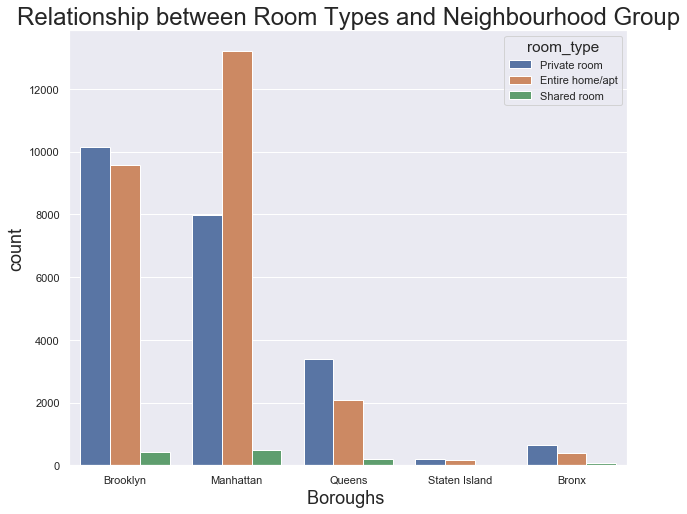

In [26]:
visual2=sns.countplot(x='neighbourhood_group', hue='room_type', data=df)
visual2.set_title('Relationship between Room Types and Neighbourhood Group',fontsize=24)
visual2.set(xlabel='Boroughs ')
plt.show()

# Distributions in Maps

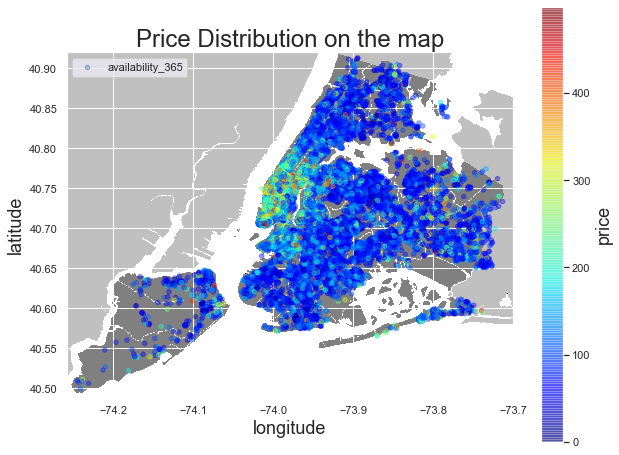

In [27]:
import urllib
#initializing the figure size
plt.figure(figsize=(10,8))
#loading the png NYC image found on Google and saving to my local folder along with the project
i=urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img=plt.imread(i)
#scaling the image based on the latitude and longitude max and mins for proper output
plt.imshow(nyc_img,zorder=0,extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()
df3=df[df.price<500]
df3.plot(kind='scatter', x='longitude', y='latitude', label='availability_365', c='price', ax=ax, 
           cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, zorder=5)
plt.title('Price Distribution on the map',fontsize=24)
plt.legend()
plt.show()

In [28]:
fig=px.scatter_mapbox(df,lat="latitude", lon="longitude" ,
                     color="neighbourhood_group", 
                     hover_name="id",hover_data=["neighbourhood"], 
                     zoom=9, height=500)
fig.update_layout(mapbox_style="open-street-map", margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Minimum Nights

In [29]:
df.minimum_nights.value_counts().head(10)

1     12720
2     11696
3      7999
30     3760
4      3303
5      3034
7      2058
6       752
14      562
10      483
Name: minimum_nights, dtype: int64

Text(0, 0.5, 'count')

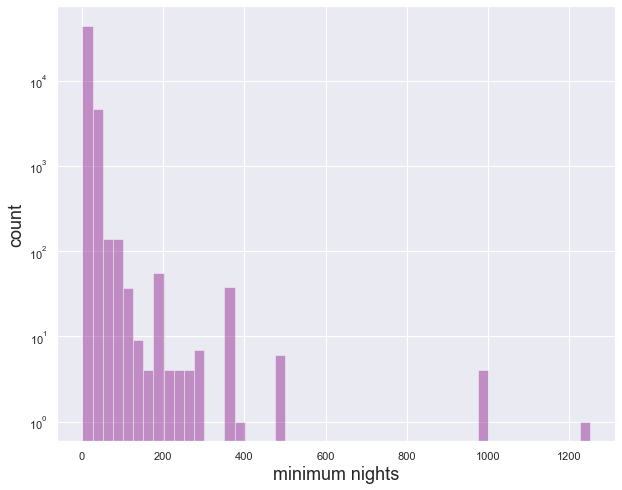

In [30]:
visual4=sns.distplot(df['minimum_nights'], rug=False, kde=False, color="purple")
visual4.set_yscale('log')
visual4.set_xlabel('minimum nights')
visual4.set_ylabel('count')

# Availability Counts in a Year

In [31]:
df.availability_365.value_counts().head()

0      17533
365     1295
364      491
1        408
89       361
Name: availability_365, dtype: int64

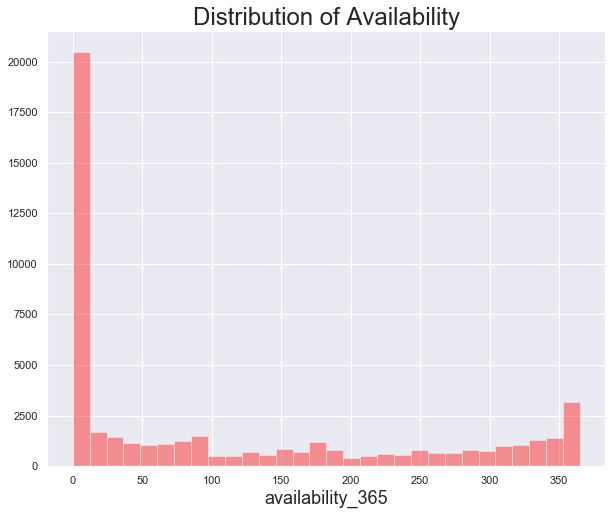

In [32]:
visual5=sns.distplot(df['availability_365'], rug=False, kde=False, color='red')
visual5.set_title('Distribution of Availability')
plt.show()

# STATISTICS

# ttest for mean of prices (Manhattan and Brooklyn)

In [33]:
# H0 = The null hypothesis in this datasets will be that both the data sets are significantly similar.
# H1 = The alternative hypothesis will be that both the data sets are significantly different.

In [34]:
price_Manhattan=df1[df1['neighbourhood_group']=='Manhattan']['price']
price_Brooklyn=df1[df1['neighbourhood_group']=='Brooklyn']['price']

In [35]:
ttest_price_M_B=stats.ttest_ind(price_Manhattan,price_Brooklyn,equal_var=False)
ttest_price_M_B

Ttest_indResult(statistic=54.95771672340229, pvalue=0.0)

If we consider the significance level to be at 5%, then to accept the null hypothesis, our p-value should be more than the chosen significance level. In our example, the p-value=0 is well under 0.05 (5%) thus we ignore null hypothesis. The t- Test correctly indicates that the means of both the dataset are different and are statistically significantly different from each other

# ztest for mean of prices (Queens and Staten Island)

In [36]:
# H0 = The null hypothesis in this datasets will be that both the data sets are significantly similar.
# H1 = The alternative hypothesis will be that both the data sets are significantly different.

In [37]:
price_Queens=df1[df1['neighbourhood_group']=='Queens']['price']
price_Staten=df1[df1['neighbourhood_group']=='Staten Island']['price']

In [38]:
from statsmodels.stats.weightstats import ztest

In [39]:
ztest(price_Queens, price_Staten,value=0 )

(-0.4171589733503411, 0.6765621316098288)

If we consider the significance level to be at 5%, then to accept the null hypothesis, 
our p-value should be more than the chosen significance level. 
In our example, the p-value=0.67 is greater than 0.05 (5%) thus we accept the null hypothesis. The  Z- Test correctly indicates that the means of both the dataset are not statistically significantly different from each other

# ztest for mean of prices (Private room and Shared room)

In [40]:
# H0 = The null hypothesis in this datasets will be that both the data sets are significantly similar.
# H1 = The alternative hypothesis will be that both the data sets are significantly different.

In [41]:
price_private=df2[df2['room_type']=='Private room']['price']
price_shared=df2[df2['room_type']=='Shared room']['price']

In [42]:
ztest(price_private, price_shared)

(11.624429343341134, 3.0965563173279354e-31)

If we consider the significance level to be at 5%, then to accept the null hypothesis, our p-value should be more than the chosen significance level. In our example, the p-value=0 is well under 0.05 (5%) thus we ignore null hypothesis. The z- Test correctly indicates that the means of both the dataset are different and are statistically significantly different from each other

# Corrolation between number of reviews and price

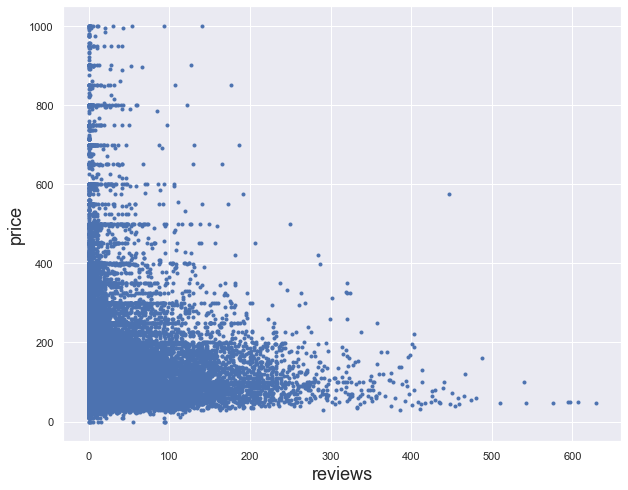

In [43]:
# Make a scatter plot
plt.plot(df1['number_of_reviews'],df1['price'],marker='.',linestyle='none')
# Label the axes
plt.xlabel('reviews')
plt.ylabel('price')
#show the result
plt.show()

In [44]:
def pearson_r(x, y):
    corr_mat=np.corrcoef(x,y)
    return corr_mat[0,1]
r=pearson_r(df1['number_of_reviews'],df1['price'])
print(r)

-0.05682644843766734


We can see that there is no corrolation between the two variables

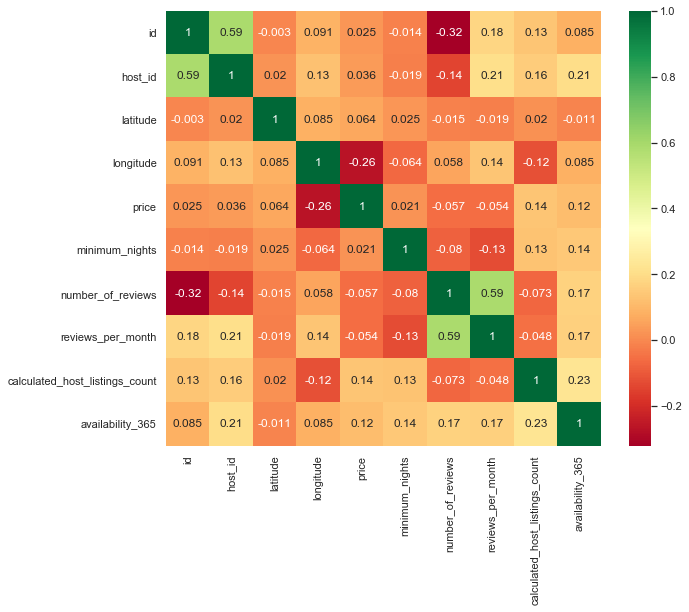

In [45]:
sns.heatmap(df1.corr(), square=True, cmap='RdYlGn',annot = True)

# MODELING

In [46]:
stats.tmax(df['price'])
firstquartile = np.percentile(df.price, 25)
thirdquartile = np.percentile(df.price, 75)
upperlim=thirdquartile +(thirdquartile-firstquartile)*1.5
print(upperlim)

334.0


In [47]:
# we eliminate outliers
df334=df[df.price<334]
df4=pd.get_dummies(df334)
df4.head()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,...,neighbourhood_Williamsbridge,neighbourhood_Williamsburg,neighbourhood_Willowbrook,neighbourhood_Windsor Terrace,neighbourhood_Woodhaven,neighbourhood_Woodlawn,neighbourhood_Woodside,room_type_Entire home/apt,room_type_Private room,room_type_Shared room
0,2539,2787,40.64749,-73.97237,149,1,9,0.21,6,365,...,0,0,0,0,0,0,0,0,1,0
1,2595,2845,40.75362,-73.98377,225,1,45,0.38,2,355,...,0,0,0,0,0,0,0,1,0,0
2,3647,4632,40.80902,-73.94190,150,3,0,0.00,1,365,...,0,0,0,0,0,0,0,0,1,0
3,3831,4869,40.68514,-73.95976,89,1,270,4.64,1,194,...,0,0,0,0,0,0,0,1,0,0
4,5022,7192,40.79851,-73.94399,80,10,9,0.10,1,0,...,0,0,0,0,0,0,0,1,0,0


In [48]:
df4.shape

(45918, 237)

# Linear Regression

In [49]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn import metrics

feature_cols1=df4.drop(['price'],axis=1)
X=feature_cols1
y=df4['price']

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.3)
reg=LinearRegression()
reg.fit(X_train,y_train)
y_pred= reg.predict(X_test)

print("R^2: {}".format(reg.score(X_test, y_test)))
rmse=np.sqrt(metrics.mean_squared_error(y_test,y_pred))

print("Root Mean Squared Error: {}".format(rmse))
cv_scores = cross_val_score(reg,X,y,cv=5)

# Print the 5-fold cross-validation scores
print("CV Scores: {}".format(cv_scores))
print("Average 5-Fold CV Score: {}".format(np.mean(cv_scores)))

R^2: 0.5267832751050847
Root Mean Squared Error: 46.710024158607105
CV Scores: [0.45076896 0.52020865 0.50274033 0.53174811 0.55264105]
Average 5-Fold CV Score: 0.5116214210255848


Using all features has improved the model score. This makes sense, as the model has more information to learn from.

# Lasso Regression

In [50]:
from sklearn.linear_model import Lasso

#regularization parameter value=1

lasso = Lasso()
lasso.fit(X_train,y_train)
lasso_pred= lasso.predict(X_test)

train_score=lasso.score(X_train,y_train)
cv_score=cross_val_score(lasso,X,y,cv=5)
test_score=lasso.score(X_test,y_test)
coeff_used = np.sum(lasso.coef_!=0)

print ("training score:", train_score)
print ("test score: ", test_score)
print("Average 5-Fold CV Score: {}".format(np.mean(cv_score)))
print ("number of features used: ", coeff_used,"\n")

training score: 0.46621907394256196
test score:  0.4653717280390569
Average 5-Fold CV Score: 0.4478450894248326
number of features used:  11 



In [51]:
#regularization parameter value=0.1

lasso01 = Lasso(alpha=0.1, max_iter=10e5)
lasso01.fit(X_train,y_train)

train_score01=lasso01.score(X_train,y_train)
test_score01=lasso01.score(X_test,y_test)
coeff_used01 = np.sum(lasso01.coef_!=0)
cv_score01=cross_val_score(lasso01,X,y,cv=5)

print ("training score for alpha=0.1:", train_score01)
print ("test score for alpha=0.1: ", test_score01)
print("Average 5-Fold CV Score: {}".format(np.mean(cv_score01)))
print ("number of features used for alpha=0.1: ", coeff_used01)

training score for alpha=0.1: 0.5119640589636576
test score for alpha=0.1:  0.5108831069788503
Average 5-Fold CV Score: 0.49527533139567514
number of features used for alpha=0.1:  44


In [52]:
#regularization parameter value=0.01

lasso001 = Lasso(alpha=0.01, max_iter=10e5)
lasso001.fit(X_train,y_train)

train_score001=lasso001.score(X_train,y_train)
test_score001=lasso001.score(X_test,y_test)
coeff_used001 = np.sum(lasso001.coef_!=0)
cv_score001=cross_val_score(lasso001,X,y,cv=5)

print ("training score for alpha=0.01:", train_score001)
print ("test score for alpha=0.01: ", test_score001)
print("Average 5-Fold CV Score: {}".format(np.mean(cv_score001)))
print ("number of features used for alpha=0.01: ", coeff_used001)

training score for alpha=0.01: 0.5275746807757774
test score for alpha=0.01:  0.525766996332232
Average 5-Fold CV Score: 0.5109302226590068
number of features used for alpha=0.01:  108


In [53]:
#regularization parameter value=0.001

lasso0001 = Lasso(alpha=0.001, max_iter=10e5)
lasso0001.fit(X_train,y_train)

train_score0001=lasso0001.score(X_train,y_train)
test_score0001=lasso0001.score(X_test,y_test)
coeff_used0001 = np.sum(lasso0001.coef_!=0)
cv_score0001=cross_val_score(lasso0001,X,y,cv=5)

print ("training score for alpha=0.001:", train_score0001)
print ("test score for alpha=0.001: ", test_score0001)
print("Average 5-Fold CV Score: {}".format(np.mean(cv_score0001)))
print ("number of features used for alpha=0.001: ", coeff_used0001)

training score for alpha=0.001: 0.5322362071423785
test score for alpha=0.001:  0.5272000168962139
Average 5-Fold CV Score: 0.5122043275070369
number of features used for alpha=0.001:  211


In [54]:
#Linear Regression
lr = LinearRegression()
lr.fit(X_train,y_train)
lr_train_score=lr.score(X_train,y_train)
lr_test_score=lr.score(X_test,y_test)
print ("LR training score:", lr_train_score)
print ("LR test score: ", lr_test_score)

LR training score: 0.532532981593357
LR test score:  0.5267832751050847


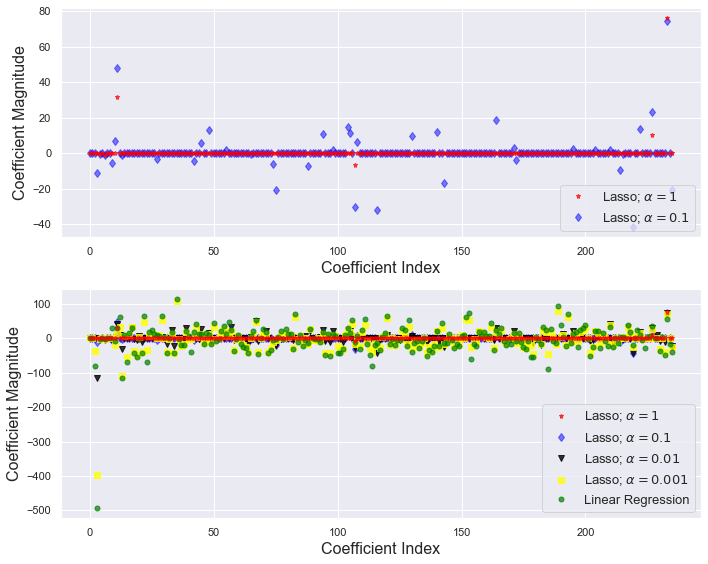

In [55]:
plt.subplot(2,1,1)
plt.plot(lasso.coef_,alpha=0.7,linestyle='none',marker='*',markersize=5,color='red',label=r'Lasso; $\alpha = 1$',zorder=7) # alpha here is for transparency
plt.plot(lasso01.coef_,alpha=0.5,linestyle='none',marker='d',markersize=6,color='blue',label=r'Lasso; $\alpha = 0.1$') # alpha here is for transparency

plt.xlabel('Coefficient Index',fontsize=16)
plt.ylabel('Coefficient Magnitude',fontsize=16)
plt.legend(fontsize=13,loc=4)

plt.subplot(2,1,2)
plt.plot(lasso.coef_,alpha=0.7,linestyle='none',marker='*',markersize=5,color='red',label=r'Lasso; $\alpha = 1$',zorder=7) # alpha here is for transparency
plt.plot(lasso01.coef_,alpha=0.5,linestyle='none',marker='d',markersize=6,color='blue',label=r'Lasso; $\alpha = 0.1$') # alpha here is for transparency
plt.plot(lasso001.coef_,alpha=0.8,linestyle='none',marker='v',markersize=6,color='black',label=r'Lasso; $\alpha = 0.01$') # alpha here is for transparency
plt.plot(lasso0001.coef_,alpha=0.8,linestyle='none',marker='s',markersize=6,color='yellow',label=r'Lasso; $\alpha = 0.001$') # alpha here is for transparency
plt.plot(lr.coef_,alpha=0.7,linestyle='none',marker='o',markersize=5,color='green',label='Linear Regression',zorder=2)

plt.xlabel('Coefficient Index',fontsize=16)
plt.ylabel('Coefficient Magnitude',fontsize=16)
plt.legend(fontsize=13,loc=4)
plt.tight_layout()
plt.show()

In [ ]:
#Let’s understand the plot and the code in a short summary.

#The default value of regularization parameter in Lasso regression (given by α) is 1.

#With this, out of 237 features in cancer data-set, only 11 features are used (non zero value of the coefficient).

#Now α = 0.1, non-zero features =44, training and test score increases.

#Comparison of coefficient magnitude for two different values of alpha are shown in the left panel of figure 2. For alpha =1, we can see most of the coefficients are zero or nearly zero, which is not the case for alpha=0.1.

#Further reduce α =0.001, non-zero features = 211. Training and test scores are similar to basic linear regression case.

# Best Prameter in Lasso Regression

In [57]:
from sklearn.model_selection import GridSearchCV
normalizes= ([True,False])
alphas = np.array([1,0.1,0.01,0.001,0])

# Instantiate a lasso regression classifier
lasso = Lasso()

# Instantiate the GridSearchCV object
lasso_cv = GridSearchCV(lasso, param_grid=(dict(alpha=alphas, normalize= normalizes)),scoring='r2',cv=5)

# Fit it to the data
lasso_cv.fit(X_train, y_train)

# Print the tuned parameters and score
print("Tuned Lasso Regression Parameters: {}".format(lasso_cv.best_params_)) 
print("Best R^2 is {}".format(lasso_cv.best_score_))

lasso_pred= lasso_cv.predict(X_test)
rmse_lasso=np.sqrt(metrics.mean_squared_error(y_test,lasso_pred))
print("Root Mean Squared Error: {}".format(rmse_lasso))

Tuned Lasso Regression Parameters: {'alpha': 0.001, 'normalize': False}
Best R^2 is 0.52443517635176
Root Mean Squared Error: 46.6894394029763


When we use gridsearchcv for best parameters in Lasso Regression, we see that we got best R^2 result with alpha= 0.001.

# Ridge Regression

In [58]:
from sklearn.linear_model import Ridge

# Setup the hyperparameter grid
normalizes= ([True,False])
alphas = np.array([1,0.1,0.01,0.001,0])
# Instantiate a lasso regression
ridge = Ridge()

# Instantiate the GridSearchCV object
ridge_cv = GridSearchCV(ridge, param_grid=(dict(alpha=alphas, normalize= normalizes)),scoring='r2', cv=5)

# Fit it to the data
ridge_cv.fit(X_train, y_train)

# Print the tuned parameters and score
print("Tuned Ridge Regression Parameters: {}".format(ridge_cv.best_params_)) 
print("Best R^2 is {}".format(ridge_cv.best_score_))

ridge_pred= ridge_cv.predict(X_test)
rmse_ridge=np.sqrt(metrics.mean_squared_error(y_test,ridge_pred))
print("Root Mean Squared Error: {}".format(rmse_ridge))

Tuned Ridge Regression Parameters: {'alpha': 1.0, 'normalize': False}
Best R^2 is 0.5245130760323674
Root Mean Squared Error: 46.69085680524192


When we use gridsearchcv for best parameters in Ridge Regression, we see that we got best R^2 result with alpha= 1.

# ElasticNet Regression

In [59]:
from sklearn.linear_model import ElasticNet

# Setup the hyperparameter grid
normalizes= ([True,False])
alphas = np.array([1,0.1,0.01,0.001,0])

# Instantiate a ElasticNet regression
elasticreg= ElasticNet()

# Instantiate the GridSearchCV object
elasticreg_cv = GridSearchCV(elasticreg, param_grid=(dict(alpha=alphas, normalize= normalizes)),scoring='r2', cv=5)

# Fit it to the data
elasticreg_cv.fit(X_train, y_train)

# Print the tuned parameters and score
print("Tuned ElasticNet Regression Parameters: {}".format(elasticreg_cv.best_params_)) 
print("Best R^2 is {}".format(elasticreg_cv.best_score_))

elastic_pred= elasticreg_cv.predict(X_test)
rmse_elastic=np.sqrt(metrics.mean_squared_error(y_test,elastic_pred))
print("Root Mean Squared Error: {}".format(rmse_elastic))

Tuned ElasticNet Regression Parameters: {'alpha': 0.001, 'normalize': False}
Best R^2 is 0.5236499785199499
Root Mean Squared Error: 46.762082228069


When we use gridsearchcv for best parameters in ElasticNet Regression, we see that we got best R^2 result with alpha= 0.

# Decision Tree Regressor

In [60]:
from sklearn import tree

tree=tree.DecisionTreeRegressor()
tree.fit(X_train,y_train)
tree_pred= tree.predict(X_test)

print("R^2: {}".format(tree.score(X_test, y_test)))
rmse_tree=np.sqrt(metrics.mean_squared_error(y_test,tree_pred))
print("Root Mean Squared Error: {}".format(rmse_tree))
cv_scores = cross_val_score(tree,X,y,cv=5)

# Print the 5-fold cross-validation scores
print("CV Scores: {}".format(cv_scores))
print("Average 5-Fold CV Score: {}".format(np.mean(cv_scores)))

R^2: 0.1687713840878401
Root Mean Squared Error: 61.90707603107879
CV Scores: [-0.4563173   0.10740392  0.13278091  0.18798963 -0.05226879]
Average 5-Fold CV Score: -0.016082326067298737


# Random Forest Regressor

In [61]:
from sklearn.ensemble import RandomForestRegressor

rfc=RandomForestRegressor()
rfc.fit(X_train,y_train)
y_pred= rfc.predict(X_test)

print("R^2: {}".format(rfc.score(X_test, y_test)))
rmse=np.sqrt(metrics.mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error: {}".format(rmse))
cv_scores = cross_val_score(rfc,X,y,cv=5)

# Print the 5-fold cross-validation scores
print("CV Scores: {}".format(cv_scores))
print("Average 5-Fold CV Score: {}".format(np.mean(cv_scores)))

R^2: 0.5822217782306955
Root Mean Squared Error: 43.888723304726184
CV Scores: [0.42643803 0.55208288 0.54458003 0.57566372 0.53418482]
Average 5-Fold CV Score: 0.5265898945469416


# Gradient Boosting Regressor

In [62]:
from sklearn.ensemble import GradientBoostingRegressor

gbr=GradientBoostingRegressor()
gbr.fit(X_train,y_train)
y_pred= gbr.predict(X_test)
print("R^2: {}".format(gbr.score(X_test, y_test)))
rmse=np.sqrt(metrics.mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error: {}".format(rmse))
cv_scores = cross_val_score(gbr,X,y,cv=5)

# Print the 5-fold cross-validation scores
print("CV Scores: {}".format(cv_scores))
print("Average 5-Fold CV Score: {}".format(np.mean(cv_scores)))

R^2: 0.5635638538022929
Root Mean Squared Error: 44.85805150771174
CV Scores: [0.49130848 0.55431746 0.54143723 0.56992764 0.56958598]
Average 5-Fold CV Score: 0.5453153564479486


# Linear SVM

In [63]:
from sklearn.svm import LinearSVC
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
x_train = scaler.fit(X_train).transform(X_train)
Lsvc=LinearSVC()
Lsvc.fit(x_train,y_train)
y_pred= Lsvc.predict(X_test)
print("R^2: {}".format(Lsvc.score(X_test, y_test)))
rmse=np.sqrt(metrics.mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.00029036004645760743
Root Mean Squared Error: 135.28424231784052


# Nonlinear SVM

In [64]:
from sklearn.svm import SVC

scaler = MinMaxScaler()
x_train = scaler.fit(X_train).transform(X_train)
nusvc=SVC(gamma='auto',kernel='rbf')
nusvc.fit(x_train,y_train)
y_pred= nusvc.predict(X_test)
print("R^2: {}".format(nusvc.score(X_test, y_test)))
rmse=np.sqrt(metrics.mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.04500580720092915
Root Mean Squared Error: 70.59253838068891


# Apply the best model for all samples

In [71]:
# We got best R^2 result from Random Forest Regressor.
# I will use the model for all samples.
df5=pd.get_dummies(df)
df5.shape

(48895, 239)

In [70]:
features=df5.drop(['price'],axis=1)
X=features
y=df5['price']

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.3)
rfc=RandomForestRegressor()
rfc.fit(X_train,y_train)
y_pred= rfc.predict(X_test)

print("R^2: {}".format(rfc.score(X_test, y_test)))
rmse=np.sqrt(metrics.mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error: {}".format(rmse))
cv_scores = cross_val_score(rfc,X,y,cv=5)

# Print the 5-fold cross-validation scores
print("CV Scores: {}".format(cv_scores))
print("Average 5-Fold CV Score: {}".format(np.mean(cv_scores)))

R^2: 0.2349521749767013
Root Mean Squared Error: 218.16925823759263
CV Scores: [-0.0233481   0.09181452  0.04001378  0.13007866 -0.30118657]
Average 5-Fold CV Score: -0.012525542363539288
